# Welcome and have fun learning



#### Linear regression excels at extrapolating trends, but can't learn interactions. XGBoost excels at learning interactions, but can't extrapolate trends. We'll learn how to create "hybrid" forecasters that combine complementary learning algorithms and let the strengths of one make up for the weakness of the other. 

## Feature engineering and Linear model based on excellent: https://www.kaggle.com/ambrosm/tpsjan22-03-linear-model @ambrosm
## Hybrid model from Time series course: https://www.kaggle.com/learn/time-series

Objective of this notebook used to be a ~simple~ and robust time series regression for future use.

<blockquote style="margin-right:auto; margin-left:auto; padding: 1em; margin:24px;">
    <strong>Fork This Notebook!</strong><br>
Create your own editable copy of this notebook by clicking on the <strong>Copy and Edit</strong> button in the top right corner.
</blockquote>

**Notes:**

## Imports and Configuration ##

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

from scipy import stats
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator, FormatStrFormatter, PercentFormatter
import seaborn as sns


import ipywidgets as widgets
from learntools.time_series.style import *  # plot style settings
# from learntools.time_series.utils import (create_multistep_example,
#                                           load_multistep_data,
#                                           make_lags,
#                                           make_multistep_target,
#                                           plot_multistep)

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from statsmodels.tsa.deterministic import CalendarFourier, DeterministicProcess
from catboost import CatBoostRegressor
from xgboost import XGBRegressor
import lightgbm as lgb

from datetime import date
import holidays
import dateutil.easter as easter

from collections import defaultdict
le = defaultdict(LabelEncoder)

# Set Matplotlib defaults
plt.style.use("seaborn-whitegrid")
plt.rc("figure", autolayout=True, figsize=(12, 8))
plt.rc(
    "axes",
    labelweight="bold",
    labelsize="large",
    titleweight="bold",
    titlesize=16,
    titlepad=10,
)
plot_params = dict(
    color="0.75",
    style=".-",
    markeredgecolor="0.25",
    markerfacecolor="0.25",
    legend=False,
)
%config InlineBackend.figure_format = 'retina'


# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import gc
import os
import math
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/tpsjan22-03-linear-model/oof.pickle
/kaggle/input/tpsjan22-03-linear-model/submission_linear_model.csv
/kaggle/input/tpsjan22-03-linear-model/__results__.html
/kaggle/input/tpsjan22-03-linear-model/train_pred.pickle
/kaggle/input/tpsjan22-03-linear-model/submission_linear_model_rounded.csv
/kaggle/input/tpsjan22-03-linear-model/__resultx__.html
/kaggle/input/tpsjan22-03-linear-model/__notebook__.ipynb
/kaggle/input/tpsjan22-03-linear-model/__output__.json
/kaggle/input/tpsjan22-03-linear-model/custom.css
/kaggle/input/tpsjan22-03-linear-model/__results___files/__results___9_5.png
/kaggle/input/tpsjan22-03-linear-model/__results___files/__results___15_0.png
/kaggle/input/tpsjan22-03-linear-model/__results___files/__results___9_0.png
/kaggle/input/tpsjan22-03-linear-model/__results___files/__results___13_3.png
/kaggle/input/tpsjan22-03-linear-model/__results___files/__results___27_2.png
/kaggle/input/tpsjan22-03-linear-model/__results___files/__results___9_1.png
/kaggle/inp

# Fine tuning

In [2]:
# -----------------------------------------------------------------
# Some parameters to config 
PRODUCTION = True # True: For submission run. False: Fast trial run

# Hyperparameters
FOLDS = 20 if PRODUCTION else 5   # Only 5 or 10.
EPOCHS = 68        # Does not matter with Early stopping. Deep network should not take too much epochs to learn
BATCH_SIZE = 2048   # large enough to fit RAM. If unstable, tuned downward. 4096 2048
ACTIVATION = 'swish' # swish mish relu selu ;swish overfit more cause of narrow global minimun
KERNEL_INIT = "glorot_normal" # Minimal impact, but give your init the right foot forward glorot_uniform lecun_normal
LEARNING_RATE = 0.000965713 # Not used. Optimal lr is about half the maximum lr 
LR_FACTOR = 0.5   # LEARNING_RATE * LR_FACTOR = New Learning rate on ReduceLROnPlateau. lower down when the LR oscillate
MIN_DELTA = 0.0000001 # Default 0.0001 0.0000001
RLRP_PATIENCE = 5 # Learning Rate reduction on ReduceLROnPlateau
ES_PATIENCE = 16  # Early stopping
DROPOUT = 0.05     # Act like L1 L2 regulator. lower your learning rate in order to overcome the "boost" that the dropout probability gives to the learning rate.
HIDDEN_LAYERS = [320, 288, 64, 32]

OPTIMIZER = 'adam' # adam adamax nadam
LOSS ='sparse_categorical_crossentropy' # sparse_categorical_crossentropy does not require onehot encoding on labels. categorical_crossentropy
METRICS ='accuracy'  # acc accuracy categorical_accuracy sparse_categorical_accuracy
ACC_VAL_METRICS = 'val_accuracy' # 'val_acc' val_accuracy val_sparse_categorical_accuracy
ACC_METRICS = 'accuracy' # acc accuracy 'sparse_categorical_accuracy'

# The dataset is too huge for trial. Sampling it for speed run!
SAMPLE = 2262087 if PRODUCTION else 11426   # True for FULL run. Max Sample size per category. For quick test: y counts [1468136, 2262087, 195712, 377, 1, 11426, 62261]  # 4000000 total rows
VALIDATION_SPLIT = 0.15 # Only used to min dataset for quick test
MAX_TRIAL = 3           # speed trial any% Not used here
MI_THRESHOLD = 0.001    # Mutual Information threshold value to drop.

RANDOM_STATE = 42
VERBOSE = 0

# Admin
ID = "row_id"            # Id id x X index
INPUT = "../input/tabular-playground-series-jan-2022"
TPU = False           # True: use TPU.
BEST_OR_FOLD = False # True: use Best model, False: use KFOLD softvote
FEATURE_ENGINEERING = True
PSEUDO_LABEL = False # PSEUDO are not ground true and will not help long term, only used for final push
BLEND = True
PSEUDO_DIR = "../input/tps-01-2022/submission.csv"
PSEUDO_DIR2 = "../input/lolfaker/faker401769.csv"

# time series data common new feature  
DATE = "date"
YEAR = "year"
MONTH = "month"
WEEK = "week"
DAY = "day"
DAYOFYEAR = "dayofyear"
DAYOFMONTH = "dayofMonth"
DAYOFWEEK = "dayofweek"
WEEKDAY = "weekday"

assert BATCH_SIZE % 2 == 0, \
    "BATCH_SIZE must be even number."

# Loss function SMAPE
​​i=1​∑​N​​w​i​​​​100​i=1​∑​N​​​(∣t​i​​∣+∣a​i​​∣)/2​​w​i​​∣a​i​​−t​i​​∣​​​​

In [3]:
# https://www.kaggle.com/c/web-traffic-time-series-forecasting/discussion/36414
def smape_loss(y_true, y_pred):
    """
    SMAPE Loss
    Parameters
    ----------
    y_true : array-like of shape (n_samples,) or (n_samples, n_outputs)
        Ground truth (correct) target values.
    y_pred : array-like of shape (n_samples,) or (n_samples, n_outputs)
        Estimated target values.
    Returns
    -------
    loss : float or ndarray of floats
        If multioutput is 'raw_values', then mean absolute error is returned
        for each output separately.
        If multioutput is 'uniform_average' or an ndarray of weights, then the
        weighted average of all output errors is returned.
        SMAPE output is non-negative floating point. The best value is 0.0.

    """
    denominator = (np.abs(y_true) + np.abs(y_pred)) / 200.0
    diff = np.abs(y_true - y_pred) / denominator
    diff[denominator == 0] = 0.0
    return np.mean(diff)


In [4]:
# https://www.kaggle.com/c/ventilator-pressure-prediction/discussion/282735
def better_than_median(inputs, axis):
    """Compute the mean of the predictions if there are no outliers,
    or the median if there are outliers.

    Parameter: inputs = ndarray of shape (n_samples, n_folds)"""
    spread = inputs.max(axis=axis) - inputs.min(axis=axis) 
    spread_lim = 0.45
    print(f"Inliers:  {(spread < spread_lim).sum():7} -> compute mean")
    print(f"Outliers: {(spread >= spread_lim).sum():7} -> compute median")
    print(f"Total:    {len(inputs):7}")
    return np.where(spread < spread_lim,
                    np.mean(inputs, axis=axis),
                    np.median(inputs, axis=axis))

In [5]:
def plot_periodogram(ts, detrend='linear', ax=None):
    from scipy.signal import periodogram
    fs = pd.Timedelta("1Y") / pd.Timedelta("1D")
    freqencies, spectrum = periodogram(
        ts,
        fs=fs,
        detrend=detrend,
        window="boxcar",
        scaling='spectrum',
    )
    if ax is None:
        _, ax = plt.subplots()
    ax.step(freqencies, spectrum, color="purple")
    ax.set_xscale("log")
    ax.set_xticks([1, 2, 4, 6, 12, 26, 52, 104])
    ax.set_xticklabels(
        [
            "Annual (1)",
            "Semiannual (2)",
            "Quarterly (4)",
            "Bimonthly (6)",
            "Monthly (12)",
            "Biweekly (26)",
            "Weekly (52)",
            "Semiweekly (104)",
        ],
        rotation=30,
    )
    ax.ticklabel_format(axis="y", style="sci", scilimits=(0, 0))
    ax.set_ylabel("Variance")
    ax.set_title("Periodogram")
    return ax

## Data Preprocessing ##

Before we can do any feature engineering, we need to *preprocess* the data to get it in a form suitable for analysis. We'll need to:
- **Load** the data from CSV files
- **Clean** the data to fix any errors or inconsistencies
- **Encode** the statistical data type (numeric, categorical)
- **Impute** any missing values

We'll wrap all these steps up in a function, which will make easy for you to get a fresh dataframe whenever you need. After reading the CSV file, we'll apply three preprocessing steps, `clean`, `encode`, and `impute`, and then create the data splits: one (`df_train`) for training the model, and one (`df_test`) for making the predictions that you'll submit to the competition for scoring on the leaderboard.

### Handle Missing Values ###

Handling missing values now will make the feature engineering go more smoothly. We'll impute `0` for missing numeric values and `"None"` for missing categorical values. You might like to experiment with other imputation strategies. In particular, you could try creating "missing value" indicators: `1` whenever a value was imputed and `0` otherwise.

In [6]:
def impute(df):
    for name in df.select_dtypes("number"):
        df[name] = df[name].fillna(0)
    for name in df.select_dtypes("category"):
        df[name] = df[name].fillna("None")
    return df

## Reduce Memory usage

In [7]:
# for col in df.select_dtypes('int').columns:
#     df[col] = pd.to_numeric(df[col], downcast = 'integer')

def reduce_mem_usage(df, verbose=True):
    numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
    start_mem = df.memory_usage().sum() / 1024**2

    for col in df.columns:
        col_type = df[col].dtypes

        if col_type in numerics:
            c_min = df[col].min()
            c_max = df[col].max()

            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)  
            else:
                if c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)

    end_mem = df.memory_usage().sum() / 1024**2

    if verbose:
        print('Mem. usage decreased to {:5.2f} Mb ({:.1f}% reduction)'.format(end_mem, 100 * (start_mem - end_mem) / start_mem))
 
    return df

# Data/Feature Engineering

In [8]:
def fourier_features(index, freq, order):
    time = np.arange(len(index), dtype=np.float32)
    k = 2 * np.pi * (1 / freq) * time
    features = {}
    for i in range(1, order + 1):
        features.update({
            f"sin_{freq}_{i}": np.sin(i * k),
            f"cos_{freq}_{i}": np.cos(i * k),
        })
    return pd.DataFrame(features, index=index)

# Compute Fourier features to the 4th order (8 new features) for a
# series y with daily observations and annual seasonality:
#
# fourier_features(y, freq=365.25, order=4)

def get_basic_ts_features(df):
    
    gdp_df = pd.read_csv('../input/gdp-20152019-finland-norway-and-sweden/GDP_data_2015_to_2019_Finland_Norway_Sweden.csv')
    gdp_df.set_index('year', inplace=True)
    gdp_exponent = 1.2121103201489674 # see https://www.kaggle.com/ambrosm/tpsjan22-03-linear-model for an explanation
    def get_gdp(row):
        country = 'GDP_' + row.country
        return gdp_df.loc[row.date.year, country]
    
    df['gdp'] = np.log1p(df.apply(get_gdp, axis=1))
    
    for country in ['Finland', 'Norway']:
        df[country] = df.country == country
    for store in ['KaggleMart']:
        df[store] = df['store'] == store
    for product in ['Kaggle Mug', 'Kaggle Sticker']:
        df[product] = df['product'] == product
    
#     df[YEAR] = df[DATE].dt.year
#     df[MONTH] = df[DATE].dt.month
#     df[WEEK] = df[DATE].dt.week
#     df[DAY] = df[DATE].dt.day
#     df[DAYOFYEAR] = df[DATE].dt.dayofyear
#     df[DAYOFMONTH] = df[DATE].dt.days_in_month
#     df[DAYOFWEEK] = df[DATE].dt.dayofweek
#    df[WEEKDAY] = df[DATE].dt.weekday

    df['wd4'] = df[DATE].dt.weekday == 4
    df['wd56'] = df[DATE].dt.weekday >= 5
#     df.loc[(df.date.dt.year != 2016) & (df.date.dt.month >=3), DAYOFYEAR] += 1 # fix for leap years
    
    # 21 days cyclic for lunar
    dayofyear = df.date.dt.dayofyear
    for k in range(1, 32, 4):
        df[f'sin{k}'] = np.sin(dayofyear / 365 * 2 * math.pi * k)
        df[f'cos{k}'] = np.cos(dayofyear / 365 * 2 * math.pi * k)
#         df[f'Finland_sin{k}'] = df[f'sin{k}'] * df['Finland']
#         df[f'Finland_cos{k}'] = df[f'cos{k}'] * df['Finland']
#         df[f'Norway_sin{k}'] = df[f'sin{k}'] * df['Norway']
#         df[f'Norway_cos{k}'] = df[f'cos{k}'] * df['Norway']
        df[f'store_sin{k}'] = df[f'sin{k}'] * df['KaggleMart']
        df[f'store_cos{k}'] = df[f'cos{k}'] * df['KaggleMart']
#         df[f'mug_sin{k}'] = df[f'sin{k}'] * df['Kaggle Mug']
#         df[f'mug_cos{k}'] = df[f'cos{k}'] * df['Kaggle Mug']
#         df[f'sticker_sin{k}'] = df[f'sin{k}'] * df['Kaggle Sticker']
#         df[f'sticker_cos{k}'] = df[f'cos{k}'] * df['Kaggle Sticker']
    
#     df = pd.concat([df, pd.DataFrame({f'fin{ptr[1]}':
#                                       (df.date == pd.Timestamp(ptr[0])) & (df.country == 'Finland')
#                                       for ptr in holidays.Finland(years = [2015,2016,2017,2018,2019]).items()})], axis=1)
#     df = pd.concat([df, pd.DataFrame({f'nor{ptr[1]}':
#                                       (df.date == pd.Timestamp(ptr[0])) & (df.country == 'Norway')
#                                       for ptr in holidays.Norway(years = [2015,2016,2017,2018,2019]).items()})], axis=1)
#     df = pd.concat([df, pd.DataFrame({f'swe{ptr[1]}':
#                                       (df.date == pd.Timestamp(ptr[0])) & (df.country == 'Sweden')
#                                       for ptr in holidays.Sweden(years = [2015,2016,2017,2018,2019]).items()})], axis=1)

#     for ptr in holidays.Finland(years = [2015,2016,2017,2018,2019]).items():
#         df[f"fin{ptr[1]}"] = (df.date == pd.Timestamp(ptr[0])) & (df.country == 'Finland')
#     for ptr in holidays.Norway(years = [2015,2016,2017,2018,2019]).items():
#         df[f"nor{ptr[1]}"] = (df.date == pd.Timestamp(ptr[0])) & (df.country == 'Norway')
#     for ptr in holidays.Sweden(years = [2015,2016,2017,2018,2019]).items():
#         df[f"swe{ptr[1]}"] = (df.date == pd.Timestamp(ptr[0])) & (df.country == 'Sweden')
    
    # End of year
    # Dec
    for d in range(24, 32):
        df[f"dec{d}"] = (df.date.dt.month == 12) & (df.date.dt.day == d)
    for d in range(24, 32):
        df[f"n-dec{d}"] = (df.date.dt.month == 12) & (df.date.dt.day == d) & (df.country == 'Norway')
    # Jan
    for d in range(1, 14):
        df[f"f-jan{d}"] = (df.date.dt.month == 1) & (df.date.dt.day == d) & (df.country == 'Finland')
    for d in range(1, 10):
        df[f"n-jan{d}"] = (df.date.dt.month == 1) & (df.date.dt.day == d) & (df.country == 'Norway')
    for d in range(1, 15):
        df[f"s-jan{d}"] = (df.date.dt.month == 1) & (df.date.dt.day == d) & (df.country == 'Sweden')
    # May
    for d in list(range(1, 10)):
        df[f"may{d}"] = (df.date.dt.month == 5) & (df.date.dt.day == d)
    for d in list(range(19, 26)):
        df[f"may{d}"] = (df.date.dt.month == 5) & (df.date.dt.day == d) & (df.country == 'Norway')
    # June
    for d in list(range(8, 14)):
        df[f"june{d}"] = (df.date.dt.month == 6) & (df.date.dt.day == d) & (df.country == 'Sweden')
    
    #Swedish Rock Concert
    #Jun 3, 2015 – Jun 6, 2015
    #Jun 8, 2016 – Jun 11, 2016
    #Jun 7, 2017 – Jun 10, 2017
    #Jun 6, 2018 – Jun 10, 2018
    #Jun 5, 2019 – Jun 8, 2019
    swed_rock_fest  = df.date.dt.year.map({2015: pd.Timestamp(('2015-06-6')),
                                         2016: pd.Timestamp(('2016-06-11')),
                                         2017: pd.Timestamp(('2017-06-10')),
                                         2018: pd.Timestamp(('2018-06-10')),
                                         2019: pd.Timestamp(('2019-06-8'))})

    df = pd.concat([df, pd.DataFrame({f"swed_rock_fest{d}":
                                      (df.date - swed_rock_fest == np.timedelta64(d, "D")) & (df.country == 'Sweden')
                                      for d in list(range(-3, 3))})], axis=1)

    
    # Last Wednesday of June
    wed_june_date = df.date.dt.year.map({2015: pd.Timestamp(('2015-06-24')),
                                         2016: pd.Timestamp(('2016-06-29')),
                                         2017: pd.Timestamp(('2017-06-28')),
                                         2018: pd.Timestamp(('2018-06-27')),
                                         2019: pd.Timestamp(('2019-06-26'))})
    for d in list(range(-4, 6)):
        df[f"wed_june{d}"] = (df.date - wed_june_date == np.timedelta64(d, "D")) & (df.country != 'Norway')
        
    # First Sunday of November
    sun_nov_date = df.date.dt.year.map({2015: pd.Timestamp(('2015-11-1')),
                                         2016: pd.Timestamp(('2016-11-6')),
                                         2017: pd.Timestamp(('2017-11-5')),
                                         2018: pd.Timestamp(('2018-11-4')),
                                         2019: pd.Timestamp(('2019-11-3'))})
    df = pd.concat([df, pd.DataFrame({f"sun_nov{d}":
                                      (df.date - sun_nov_date == np.timedelta64(d, "D")) & (df.country == 'Norway')
                                      for d in list(range(0, 9))})], axis=1)
    # First half of December (Independence Day of Finland, 6th of December)
    df = pd.concat([df, pd.DataFrame({f"dec{d}":
                                      (df.date.dt.month == 12) & (df.date.dt.day == d) & (df.country == 'Finland')
                                      for d in list(range(6, 14))})], axis=1)
    # Easter
    easter_date = df.date.apply(lambda date: pd.Timestamp(easter.easter(date.year)))
    df = pd.concat([df, pd.DataFrame({f"easter{d}":
                                      (df.date - easter_date == np.timedelta64(d, "D"))
                                      for d in list(range(-2, 11)) + list(range(40, 48)) + list(range(50, 59))})], axis=1)
    
    return df  

In [9]:
for ptr in holidays.Norway(years = [2019], observed=True).items():
    print(ptr)

(datetime.date(2019, 1, 1), 'Første nyttårsdag')
(datetime.date(2019, 5, 1), 'Arbeidernes dag')
(datetime.date(2019, 5, 17), 'Grunnlovsdag')
(datetime.date(2019, 12, 25), 'Første juledag')
(datetime.date(2019, 12, 26), 'Andre juledag')
(datetime.date(2019, 4, 18), 'Skjærtorsdag')
(datetime.date(2019, 4, 19), 'Langfredag')
(datetime.date(2019, 4, 21), 'Første påskedag')
(datetime.date(2019, 4, 22), 'Andre påskedag')
(datetime.date(2019, 5, 30), 'Kristi himmelfartsdag')
(datetime.date(2019, 6, 9), 'Første pinsedag')
(datetime.date(2019, 6, 10), 'Andre pinsedag')


In [10]:
def feature_engineer(df):
    df = get_basic_ts_features(df)
    return df

from pathlib import Path


def load_data():
    # Read data
    data_dir = Path(INPUT)
    df_train = pd.read_csv(data_dir / "train.csv", index_col=ID)
    df_test = pd.read_csv(data_dir / "test.csv", index_col=ID)
    column_y = df_train.columns.difference(
        df_test.columns)[0]  # column_y target_col label_col
    return df_train, df_test, column_y

In [11]:
from pathlib import Path


def load_data():
    # Read data
    data_dir = Path(INPUT)
    df_train = pd.read_csv(data_dir / "train.csv", parse_dates=[DATE],
                    usecols=['date', 'country', 'store', 'product', 'num_sold'],
                    dtype={
                        'country': 'category',
                        'store': 'category',
                        'product': 'category',
                        'num_sold': 'float32',
                    },
                    infer_datetime_format=True,)
    df_test = pd.read_csv(data_dir / "test.csv", index_col=ID, parse_dates=[DATE])
    column_y = df_train.columns.difference(
        df_test.columns)[0]  # column_y target_col label_col
    df_train[DATE] = pd.to_datetime(df_train[DATE])
    df_test[DATE] = pd.to_datetime(df_test[DATE])
    return df_train, df_test, column_y


In [12]:
def process_data(df_train, df_test):
    # Preprocessing
#     df_train = impute(df_train)
#     df_test = impute(df_test)
    
    if FEATURE_ENGINEERING:
        df_train = feature_engineer(df_train)
        df_test = feature_engineer(df_test)
    
#     df_train = reduce_mem_usage(df_train)
#     df_test = reduce_mem_usage(df_test)

    return df_train, df_test

In [13]:
class MultiColumnLabelEncoder:
    def __init__(self,columns = None):
        self.columns = columns # array of column names to encode

    def fit(self,X,y=None):
        return self # not relevant here

    def transform(self,X):
        '''
        Transforms columns of X specified in self.columns using
        LabelEncoder(). If no columns specified, transforms all
        columns in X.
        '''
        output = X.copy()
        if self.columns is not None:
            for col in self.columns:
                output[col] = LabelEncoder().fit_transform(output[col])
        else:
            for colname,col in output.iteritems():
                output[colname] = LabelEncoder().fit_transform(col)
        return output

    def fit_transform(self,X,y=None):
        return self.fit(X,y).transform(X)

# Load Data #

And now we can call the data loader and get the processed data splits:

In [14]:
%%time
train_df, test_df, column_y = load_data()

CPU times: user 65.2 ms, sys: 14.7 ms, total: 79.9 ms
Wall time: 126 ms


In [15]:
%%time
train_df, test_df = process_data(train_df, test_df)

CPU times: user 3.06 s, sys: 24.3 ms, total: 3.08 s
Wall time: 3.09 s


# Data Pipeline

In [16]:
train_data = train_df.copy()
train_data[DATE] = train_df.date.dt.to_period('D')
test_data = test_df.copy()
test_data[DATE] = test_df.date.dt.to_period('D')

## Pseudolabeling

In [17]:
df_pseudolabels = pd.read_csv(PSEUDO_DIR, index_col=ID)
df_pseudolabels[DATE] = pd.to_datetime(test_df[DATE])
df_pseudolabels.to_csv("pseudo_labels_v0.csv", index=True)
# if PSEUDO_LABEL:
    # df_pseudolabels = df_pseudolabels.set_index([DATE]).sort_index()
test_data[column_y] = df_pseudolabels[column_y].astype(np.float32)
train_data = pd.concat([train_data, test_data], axis=0)
train_df = pd.concat([train_df, test_data], axis=0)

In [18]:
X = train_data.set_index([DATE]).sort_index()
X_test = test_data.set_index([DATE]).sort_index()

In [19]:
train_data = train_data.set_index(['date', 'country', 'store', 'product']).sort_index()

In [20]:
kaggle_sales_2015 = (
    train_data
    .groupby(['country', 'store', 'product', 'date'])
    .mean()
    .unstack(['country', 'store', 'product'])
    .loc['2015']
)

In [21]:
kaggle_sales_2016 = (
    train_data
    .groupby(['country', 'store', 'product', 'date'])
    .mean()
    .unstack(['country', 'store', 'product'])
    .loc['2016']
)

In [22]:
kaggle_sales_2017 = (
    train_data
    .groupby(['country', 'store', 'product', 'date'])
    .mean()
    .unstack(['country', 'store', 'product'])
    .loc['2017']
)

In [23]:
kaggle_sales_2018 = (
    train_data
    .groupby(['country', 'store', 'product', 'date'])
    .mean()
    .unstack(['country', 'store', 'product'])
    .loc['2018']
)

In [24]:
frames = [kaggle_sales_2015, kaggle_sales_2016, kaggle_sales_2017, kaggle_sales_2018]
kaggle_sales = pd.concat(frames)

In [25]:
kaggle_sales

num_sold                                                  \
country       Finland                                                   
store      KaggleMart                           KaggleRama              
product    Kaggle Hat Kaggle Mug Kaggle Sticker Kaggle Hat Kaggle Mug   
date                                                                    
2015-01-01      520.0      329.0          146.0      911.0      572.0   
2015-01-02      493.0      318.0          127.0      794.0      544.0   
2015-01-03      535.0      360.0          141.0      843.0      579.0   
2015-01-04      544.0      332.0          125.0      873.0      582.0   
2015-01-05      378.0      243.0          102.0      668.0      423.0   
...               ...        ...            ...        ...        ...   
2018-12-27      573.0      414.0          177.0     1068.0      652.0   
2018-12-28      841.0      499.0          223.0     1398.0      895.0   
2018-12-29     1107.0      774.0          296.0     1895.0     1398.0   
2018-12-30     1113.0      757.0          326.0     1878.0     1241.0   
2018-12-31      822.0      469.0          238.0     1231.0      831.0   

                                                                           \
country                       Norway                                        
store                     KaggleMart                           KaggleRama   
product    Kaggle Sticker Kaggle Hat Kaggle Mug Kaggle Sticker Kaggle Hat   
date                                                                        
2015-01-01          283.0      906.0      526.0          250.0     1461.0   
2015-01-02          249.0      845.0      538.0          237.0     1446.0   
2015-01-03          265.0      930.0      614.0          254.0     1631.0   
2015-01-04          245.0      889.0      589.0          255.0     1540.0   
2015-01-05          187.0      671.0      435.0          184.0     1126.0   
...                   ...        ...        ...            ...        ...   
2018-12-27          308.0      898.0      568.0          270.0     1604.0   
2018-12-28          431.0     1162.0      731.0          361.0     2178.0   
2018-12-29          559.0     1650.0     1113.0          518.0     2884.0   
2018-12-30          554.0     1809.0     1052.0          500.0     2851.0   
2018-12-31          360.0     1124.0      728.0          351.0     2128.0   

            ...       easter58                                       \
country     ...         Norway                                        
store       ...     KaggleMart KaggleRama                             
product     ... Kaggle Sticker Kaggle Hat Kaggle Mug Kaggle Sticker   
date        ...                                                       
2015-01-01  ...            0.0        0.0        0.0            0.0   
2015-01-02  ...            0.0        0.0        0.0            0.0   
2015-01-03  ...            0.0        0.0        0.0            0.0   
2015-01-04  ...            0.0        0.0        0.0            0.0   
2015-01-05  ...            0.0        0.0        0.0            0.0   
...         ...            ...        ...        ...            ...   
2018-12-27  ...            0.0        0.0        0.0            0.0   
2018-12-28  ...            0.0        0.0        0.0            0.0   
2018-12-29  ...            0.0        0.0        0.0            0.0   
2018-12-30  ...            0.0        0.0        0.0            0.0   
2018-12-31  ...            0.0        0.0        0.0            0.0   

                                                                       \
country        Sweden                                                   
store      KaggleMart                           KaggleRama              
product    Kaggle Hat Kaggle Mug Kaggle Sticker Kaggle Hat Kaggle Mug   
date                                                                    
2015-01-01        0.0        0.0            0.0        0.0        0.0   
2015-01-02        0.0        0.0    

In [26]:
gc.collect()

84

In [27]:
# Check NA
missing_val = X.isnull().sum()
print(missing_val[missing_val > 0])

Series([], dtype: int64)


In [28]:
train_data.groupby(column_y).apply(lambda s: s.sample(min(len(s), 5)))

num_sold       gdp  \
num_sold date       country store      product                              
70.0     2015-09-17 Finland KaggleMart Kaggle Sticker      70.0  5.461456   
73.0     2015-01-19 Finland KaggleMart Kaggle Sticker      73.0  5.461456   
74.0     2015-08-20 Finland KaggleMart Kaggle Sticker      74.0  5.461456   
         2015-12-21 Finland KaggleMart Kaggle Sticker      74.0  5.461456   
         2015-02-10 Finland KaggleMart Kaggle Sticker      74.0  5.461456   
...                                                         ...       ...   
2514.0   2017-12-31 Norway  KaggleRama Kaggle Hat        2514.0  5.989948   
2694.0   2019-12-29 Norway  KaggleRama Kaggle Hat        2694.0  6.007609   
2807.0   2017-12-30 Norway  KaggleRama Kaggle Hat        2807.0  5.989948   
2851.0   2018-12-30 Norway  KaggleRama Kaggle Hat        2851.0  6.082219   
2884.0   2018-12-29 Norway  KaggleRama Kaggle Hat        2884.0  6.082219   

                                                       Finland  Norway  \
num_sold date       country store      product                           
70.0     2015-09-17 Finland KaggleMart Kaggle Sticker     True   False   
73.0     2015-01-19 Finland KaggleMart Kaggle Sticker     True   False   
74.0     2015-08-20 Finland KaggleMart Kaggle Sticker     True   False   
         2015-12-21 Finland KaggleMart Kaggle Sticker     True   False   
         2015-02-10 Finland KaggleMart Kaggle Sticker     True   False   
...                                                        ...     ...   
2514.0   2017-12-31 Norway  KaggleRama Kaggle Hat        False    True   
2694.0   2019-12-29 Norway  KaggleRama Kaggle Hat        False    True   
2807.0   2017-12-30 Norway  KaggleRama Kaggle Hat        False    True   
2851.0   2018-12-30 Norway  KaggleRama Kaggle Hat        False    True   
2884.0   2018-12-29 Norway  KaggleRama Kaggle Hat        False    True   

                                                       KaggleMart  Kaggle Mug  \
num_sold date       country store      product                                  
70.0     2015-09-17 Finland KaggleMart Kaggle Sticker        True       False   
73.0     2015-01-19 Finland KaggleMart Kaggle Sticker        True       False   
74.0     2015-08-20 Finland KaggleMart Kaggle Sticker        True       False   
         2015-12-21 Finland KaggleMart Kaggle Sticker        True       False   
         2015-02-10 Finland KaggleMart Kaggle Sticker        True       False   
...                                                           ...         ...   
2514.0   2017-12-31 Norway  KaggleRama Kaggle Hat           False       False   
2694.0   2019-12-29 Norway  KaggleRama Kaggle Hat           False       False   
2807.0   2017-12-30 Norway  KaggleRama Kaggle Hat           False       False   
2851.0   2018-12-30 Norway  KaggleRama Kaggle Hat           False       False   
2884.0   2018-12-29 Norway  KaggleRama Kaggle Hat           False       False   

                                                       Kaggle Sticker    wd4  \
num_sold date       country store      product                                 
70.0     2015-09-17 Finland KaggleMart Kaggle Sticker            True  False   
73.0     2015-01-19 Finland KaggleMart Kaggle Sticker            True  False   
74.0     2015-08-20 Finland KaggleMart Kaggle Sticker            True  False   
         2015-12-21 Finland KaggleMart Kaggle Sticker            True  False   
         2015-02-10 Finland KaggleMart Kaggle Sticker            True  False   
...                                                               ...    ...   
2514.0   2017-12-31 Norway  KaggleRama Kaggle Hat               False  False   
2694.0   2019-12-29 Norway  KaggleRama Kaggle Hat               False  False   
2807.0   2017-12-30 Norway  KaggleRama Kaggle Hat               False  False   
2851.0   2018-12-30 Norway  KaggleRama Kaggle Hat               False  False   
2884.0   2018-12-29 Norway  KaggleRama Kaggle Hat               False  False

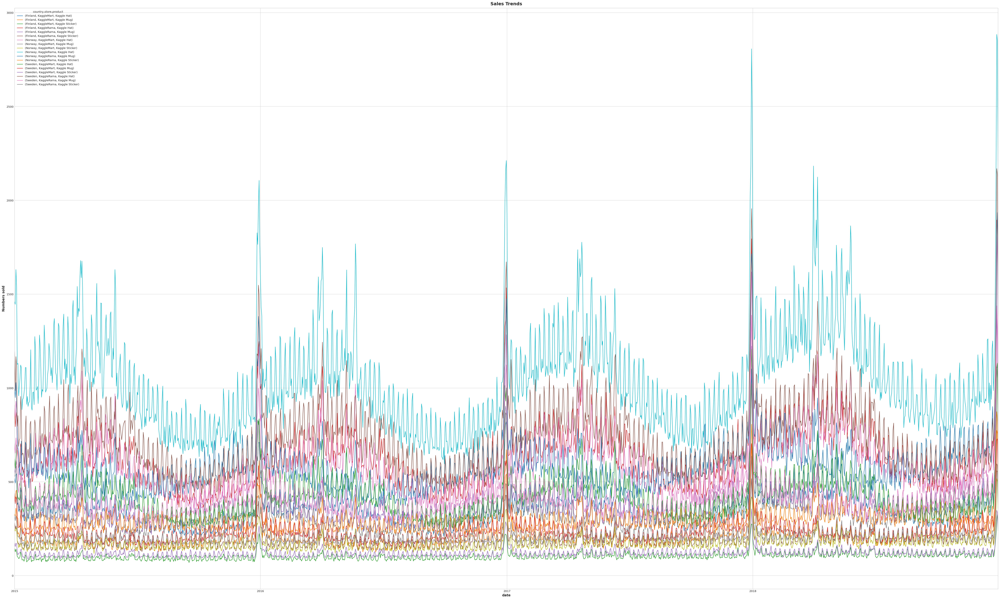

In [29]:
fig_dims = (50,30)
ax = kaggle_sales.num_sold.plot(title='Sales Trends', figsize=fig_dims)
_ = ax.set(ylabel="Numbers sold")

In [30]:
def show_me(data) :
    fig_dims = (20,10)
    fig, ax = plt.subplots(figsize=fig_dims)
    sns.set_theme(style="whitegrid")
    dates = pd.date_range("1 1 2015", periods=365, freq="D")
    dates = pd.date_range(start='1/1/2015', end='31/12/2016',  freq="D")
    data.index = dates
    sns.lineplot(data=data, palette="tab10", linewidth=1)

# What is Seasonality? #

We say that a time series exhibits **seasonality** whenever there is a regular, periodic change in the mean of the series. Seasonal changes generally follow the clock and calendar -- repetitions over a day, a week, or a year are common. Seasonality is often driven by the cycles of the natural world over days and years or by conventions of social behavior surrounding dates and times.
### Choosing Fourier features with the Periodogram

How many Fourier pairs should we actually include in our feature set? We can answer this question with the periodogram. The **periodogram** tells you the strength of the frequencies in a time series. Specifically, the value on the y-axis of the graph is `(a ** 2 + b ** 2) / 2`, where `a` and `b` are the coefficients of the sine and cosine at that frequency (as in the *Fourier Components* plot above).

<figure style="padding: 1em;">
<img src="https://i.imgur.com/PK6WEe3.png" width=600, alt="">
<figcaption style="textalign: center; font-style: italic"><center>Periodogram for the <em>Wiki Trigonometry</em> series.</center></figcaption>
</figure>

From left to right, the periodogram drops off after *Quarterly*, four times a year. That was why we chose four Fourier pairs to model the annual season. The *Weekly* frequency we ignore since it's better modeled with indicators.

### Computing Fourier features (optional)

Knowing how Fourier features are computed isn't essential to using them, but if seeing the details would clarify things, the cell hidden cell below illustrates how a set of Fourier features could be derived from the index of a time series. (We'll use a library function from `statsmodels` for our applications, however.)

Now let's look at the periodogram:

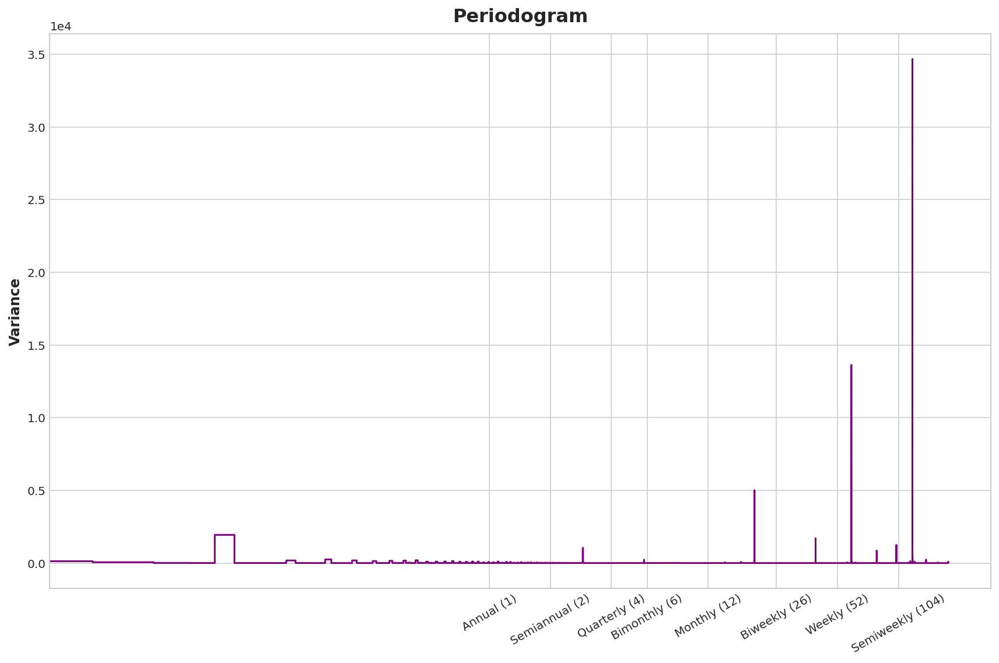

In [31]:
plot_periodogram(X[column_y]);

The periodogram agrees with the seasonal plots above: a strong semiweekly season and a weaker annual season. The weekly season we'll model with indicators and the annual season with Fourier features. From right to left, the periodogram falls off between Bimonthly (6) and Monthly (12), so let's use 10 Fourier pairs.

We'll create our seasonal features using DeterministicProcess, the same utility we used in Lesson 2 to create trend features. To use two seasonal periods (weekly and annual), we'll need to instantiate one of them as an "additional term":

# Components and Residuals #

So that we can design effective hybrids, we need a better understanding of how time series are constructed. We've studied up to now three patterns of dependence: trend, seasons, and cycles. Many time series can be closely described by an additive model of just these three components plus some essentially unpredictable, entirely random *error*:

```
series = trend + seasons + cycles + error
```

Each of the terms in this model we would then call a **component** of the time series.

The **residuals** of a model are the difference between the target the model was trained on and the predictions the model makes -- the difference between the actual curve and the fitted curve, in other words. Plot the residuals against a feature, and you get the "left over" part of the target, or what the model failed to learn about the target from that feature.

In [32]:
# annotations: https://stackoverflow.com/a/49238256/5769929
def seasonal_plot(X, y, period, freq, ax=None):
    if ax is None:
        _, ax = plt.subplots()
    palette = sns.color_palette("husl", n_colors=X[period].nunique(),)
    ax = sns.lineplot(
        x=freq,
        y=y,
        hue=period,
        data=X,
        ci=False,
        ax=ax,
        palette=palette,
        legend=False,
    )
    ax.set_title(f"Seasonal Plot ({period}/{freq})")
    for line, name in zip(ax.lines, X[period].unique()):
        y_ = line.get_ydata()[-1]
        ax.annotate(
            name,
            xy=(1, y_),
            xytext=(6, 0),
            color=line.get_color(),
            xycoords=ax.get_yaxis_transform(),
            textcoords="offset points",
            size=14,
            va="center",
        )
    return ax

In [33]:
# X.groupby(['country', 'store', 'product', 'date']).mean().loc[('Finland','KaggleMart','Kaggle Hat')]['year'] #.unstack(['country', 'store', 'product']).loc['2018']['year']

Let's take a look at seasonal plots over a week and over a year.

In [34]:
# fig, (ax0, ax1) = plt.subplots(2, 1, figsize=(22, 16))
# seasonal_plot(X.groupby(['country', 'store', 'product', 'date']).mean().loc[('Finland','KaggleMart','Kaggle Hat')], y=column_y, period="week", freq="day", ax=ax0)
# seasonal_plot(X.groupby(['country', 'store', 'product', 'date']).mean().loc[('Finland','KaggleMart','Kaggle Hat')], y=column_y, period="year", freq="dayofyear", ax=ax1);

In [35]:
# Plot all num_sold_true and num_sold_pred (five years) for one country-store-product combination
def plot_five_years_combination(engineer, country='Norway', store='KaggleMart', product='Kaggle Hat'):
    demo_df = pd.DataFrame({'row_id': 0,
                            'date': pd.date_range('2015-01-01', '2019-12-31', freq='D'),
                            'country': country,
                            'store': store,
                            'product': product})
    demo_df.set_index('date', inplace=True, drop=False)
    demo_df = engineer(demo_df)
    demo_df[GROUP_INDEX] = demo_df[GROUP_INDEX].apply(lambda x: le[x.name].transform(x))

#     display(demo_df)
    demo_df['num_sold'] = np.expm1(model.predict(preproc.transform(demo_df[features])))
    train_subset = train_df[(train_df.country == country) & (train_df.store == store) & (train_df['product'] == product)]
    plt.figure(figsize=(24, 8))
    plt.plot(demo_df[DATE], demo_df.num_sold, label='prediction', alpha=0.5)
    plt.scatter(train_subset[DATE], train_subset.num_sold, label='true', alpha=0.5, color='red', s=2)
    plt.grid(True)
#     plt.grid(which='major',axis ='y', linewidth='0.7', color='black')
    plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
    plt.legend()
    plt.title(f'{country} {store} {product} Predictions and true for five years')
    plt.show()
    return demo_df['num_sold']

In [36]:
def find_min_SMAPE(y_true, y_predict):
    loss_correction = 1
    scores = []
    # float step
    for WEIGHT in np.arange(0.97, 1.02, 0.0001):
        y_hat = y_predict.copy()
        y_hat *= WEIGHT
        scores.append(np.array([WEIGHT, np.mean(smape_loss(y_true, y_hat))]))
        
    scores = np.vstack(scores)
    min_SMAPE = np.min(scores[:,1])
    print(f'min SMAPE {min_SMAPE:.5f}')
    for x in scores:
        if x[1] == min_SMAPE:
            loss_correction = x[0]
            print(f'loss_correction: {x[0]:.5f}')
            
    plt.figure(figsize=(5, 3))
    plt.plot(scores[:,0],scores[:,1])
    plt.scatter([loss_correction], [min_SMAPE], color='g')
    plt.ylabel(f'SMAPE')
    plt.xlabel(f'loss_correction: {loss_correction:.5f}')
    plt.legend()
    plt.title(f'min SMAPE:{min_SMAPE:.5f} scaling')
    plt.show()
    
    return loss_correction

In [37]:
def plot_true_vs_prediction(df_true, df_hat):
    plt.figure(figsize=(20, 13))
    plt.scatter(np.arange(len(df_hat)), np.log1p(df_hat), label='prediction', alpha=0.5, color='blue', s=3) #np.arange(len(df_hat))
    plt.scatter(np.arange(len(df_true)), np.log1p(df_true), label='Pseudo/true', alpha=0.5, color='red', s=7) #np.arange(len(df_true))
    plt.legend()
    plt.title(f'Predictions VS Pseudo-label {column_y} (LOG)') #{df_true.index[0]} - {df_true.index[-1]}
    plt.show()

In [38]:
def plot_residuals(y_residuals):
    plt.figure(figsize=(13, 3))
    plt.scatter(np.arange(len(y_residuals)), np.log1p(y_residuals), label='residuals', alpha=0.1, color='blue', s=5)
    plt.legend()
    plt.title(f'Linear Model residuals {column_y} (LOG)') #{df_true.index[0]} - {df_true.index[-1]}
    plt.tight_layout()
    plt.show()

In [39]:
def plot_oof(y_true, y_predict):
    # Plot y_true vs. y_pred
    plt.figure(figsize=(5, 5))
    plt.scatter(y_true, y_predict, s=1, color='r', alpha=0.5)
#     plt.scatter(np.log1p(y_true), np.log1p(y_predict), s=1, color='g', alpha=0.3)
    plt.plot([plt.xlim()[0], plt.xlim()[1]], [plt.xlim()[0], plt.xlim()[1]], '--', color='k')
    plt.gca().set_aspect('equal')
    plt.xlabel('y_true')
    plt.ylabel('y_pred')
    plt.title('OOF Predictions')
    plt.show()

In [40]:
def evaluate_SMAPE(y_va, y_va_pred):
    loss_correction = 1
    # Evaluation: Execution time and SMAPE
    smape_before_correction = np.mean(smape_loss(y_va, y_va_pred))
    smape = np.mean(smape_loss(y_va, y_va_pred))
    loss_correction = find_min_SMAPE(y_va, y_va_pred)
    y_va_pred *= loss_correction
    print(f"SMAPE (before correction: {smape_before_correction:.5f})")
    print(f'Min SMAPE: {np.mean(smape_loss(y_va, y_va_pred))}')
    return loss_correction

In [41]:
GROUP_INDEX = ['country', 'store', 'product']

# Target series
y = X.loc[:, column_y]

# X_1: Features for Linear Regression
fourier = CalendarFourier(freq="A", order=10)  # 10 sin/cos pairs for "A"nnual seasonality

dp = DeterministicProcess(
    index=X.index,
    constant=True,               # dummy feature for bias (y-intercept)
    order=1,                     # trend (order 1 means linear)
    seasonal=True,               # weekly seasonality (indicators)
    additional_terms=[fourier],  # annual seasonality (fourier)
    drop=True,                   # drop terms to avoid collinearity
)

X_1 = dp.in_sample()  # create features for dates in tunnel.index


# X_2: Features for XGBoost
X_2 = X.drop(column_y, axis=1)
# Encoding the variable
X_2[GROUP_INDEX] = X_2[GROUP_INDEX].apply(lambda x: le[x.name].fit_transform(x))
# Using the dictionary to label future data
X_test[GROUP_INDEX] = X_test[GROUP_INDEX].apply(lambda x: le[x.name].transform(x))

# Label encoding for seasonality
# X_2["day"] = X_2.index.dayofyear  # values are day of the month

In [42]:
features = X_2.columns

In [43]:
X_test_1 = dp.out_of_sample(365)

# Hybrid Models
Linear regression excels at extrapolating trends, but can't learn interactions. XGBoost excels at learning interactions, but can't extrapolate trends. We'll learn how to create "hybrid" forecasters that combine complementary learning algorithms and let the strengths of one make up for the weakness of the other.

In [44]:
# Model 1 (trend)
from pyearth import Earth
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.linear_model import ElasticNet, Lasso, Ridge, HuberRegressor, RidgeCV

# Model 2
from sklearn.ensemble import ExtraTreesRegressor, RandomForestRegressor, StackingRegressor, VotingRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neural_network import MLPRegressor

In [45]:
# You'll add fit and predict methods to this minimal class
from sklearn.base import BaseEstimator, RegressorMixin
from sklearn.utils.validation import check_X_y, check_array, check_is_fitted

class BoostedHybrid(BaseEstimator, RegressorMixin):
    def __init__(self, model_1, model_2, scaler):
        self.model_1 = model_1
        self.model_2 = model_2
        self.scaler = scaler
        self.y_columns = None  # store column names from fit method
    def fit(self, X, y): #, X_1_valid, y_valid
        """A reference implementation of a fitting function.
        Parameters
        ----------
        X : {array-like, sparse matrix}, shape (n_samples, n_features)
            The training input samples.
        y : array-like, shape (n_samples,) or (n_samples, n_outputs)
            The target values (class labels in classification, real numbers in
            regression).
        Returns
        -------
        self : object
            Returns self.
        """
        X, y = check_X_y(X, y, accept_sparse=True)
        # Train model_1
        self.model_1.fit(X, y)

        # Make predictions
        y_fit = self.model_1.predict(X)
        # Compute residuals
        y_resid = y - y_fit
        
        # Make predictions
#         y_valid_fit = self.model_1.predict(X_1_valid)
        # Compute residuals
#         y_valid_resid = y_log_valid - y_valid_fit

        # Train model_2 on residuals , eval_set=[(X_1_valid, y_valid_resid)]
        self.model_2.fit(X, y_resid)
        
        # Model2 prediction
        y_fit2 = self.model_2.predict(X)
        # Compute noise
        y_resid2 = y_resid - y_fit2
        
        # Save data for question checking
        self.y = y
        self.y_fit = y_fit
        self.y_resid = y_resid
        self.y_fit2 = y_fit2
        self.y_resid2 = y_resid2

        self.is_fitted_ = True
        
        return self
    
    def predict(self, X):
        """ A reference implementation of a predicting function.
        Parameters
        ----------
        X : {array-like, sparse matrix}, shape (n_samples, n_features)
            The training input samples.
        Returns
        -------
        y : ndarray, shape (n_samples,)
            Returns an array of ones.
        """
        X = check_array(X, accept_sparse=True)
        check_is_fitted(self, 'is_fitted_')
        # Predict with model_1
        y_predict = self.model_1.predict(X)
        # Add model_2 predictions to model_1 predictions
        y_predict += self.model_2.predict(X)

        return y_predict


# Training

In [46]:
if PSEUDO_LABEL:
    TRAIN_END_DATE = "2019-12-31"
    VALID_START_DATE = "2015-01-01"
    VALID_END_DATE = "2018-12-31"
else:
    if PRODUCTION:
        TRAIN_END_DATE = "2018-12-31"
    else:
        TRAIN_END_DATE = "2017-12-31"
    VALID_START_DATE = "2018-01-01"
    VALID_END_DATE = "2018-12-31"

y_train, y_valid = y[:TRAIN_END_DATE], y[VALID_START_DATE:VALID_END_DATE]
X1_train, X1_valid = X_1[:TRAIN_END_DATE], X_1[VALID_START_DATE:VALID_END_DATE]
X2_train, X2_valid = X_2.loc[:TRAIN_END_DATE], X_2.loc[VALID_START_DATE:VALID_END_DATE]

In [47]:
# param1 = {  'loss_function' : 'MultiRMSE',
#             'eval_metric': 'SMAPE', 
#             'od_type' : 'Iter',
#             'od_wait' : 20,
#             'random_state': RANDOM_STATE,
#             'verbose': VERBOSE
#          }
#CatBoostRegressor(**param1), #XGBRegressor(objective='reg:squarederror', n_estimators=1000) MLPRegressor(),
#             model_3 = lgb.LGBMRegressor(objective='regression',
#                                         n_estimators=1000,
#                                         seed=RANDOM_STATE,
#                                        ),
#HuberRegressor(epsilon=1.20, max_iter=500), #Earth(verbose=VERBOSE), HuberRegressor(epsilon=1.20, max_iter=500), Earth(), ElasticNet(), Lasso(), 

In [48]:
# %%time
# from sklearn.model_selection import TimeSeriesSplit
# tscv = TimeSeriesSplit(n_splits=3)
# for train_index, test_index in tscv.split(X2_train[features]):
#     X_t, y_t = X2_train.iloc[train_index][features], y_train[train_index] #X2_train[train_index], y_train[train_index]
#     model.fit(X_t, y_t)
#     # Inference for validation
#     y_va_pred = model.predict(X2_train.iloc[test_index][features])

#     evaluate_SMAPE(y_train[test_index].values.reshape(-1, 1), y_va_pred)
#     plot_oof(y_train[test_index].values.reshape(-1, 1), y_va_pred)
#     plot_true_vs_prediction(y_train[test_index].values.reshape(-1, 1), y_va_pred)
#     plot_residuals(model.y_resid)
#     plot_residuals(model.y_resid2)
    
#     display(X_t)

## Using StandardScaler

In [49]:
preproc = StandardScaler()

In [50]:
def model_fit_eval(hybrid_model, X_train, y_train, X_valid, y_valid, scaler, loss_correction):
    test_pred_list = []
    # Boosted Hybrid
    hybrid_model.fit(X_train, y_train) #, X_valid, y_valid
    y_va_pred = hybrid_model.predict(X_valid)
    
    loss_correction = 1
    ###### Preprocess the validation data
    y_va = np.expm1(y_valid.copy())
    # Inference for validation
    y_va_pred = np.expm1(hybrid_model.predict(X_valid))
    loss_correction = evaluate_SMAPE(y_va, y_va_pred)
    
    ###### Visualize and evual
    plot_oof(y_va, y_va_pred)
    plot_true_vs_prediction(y_va, y_va_pred)
#     plot_residuals(hybrid_model.y_resid)
#     plot_residuals(hybrid_model.y_resid2)
    # plot_residuals(model.y_resid3)
    
    ###### Validate against 2019 PSEU #######
    loss_correction = 1
    ###### Preprocess the validation data
    y_va = df_pseudolabels[column_y].values.reshape(-1, 1)
    
    # Inference test 2019 for validation
    y_va_pred = np.expm1(hybrid_model.predict(scaler.transform(X_test[features])))
    
    # Evaluation: Execution time and SMAPE
    smape_before_correction = np.mean(smape_loss(y_va, y_va_pred.reshape(-1, 1)))
    smape = np.mean(smape_loss(y_va, y_va_pred.reshape(-1, 1)))
    print(f'***********Test Data*****************')
    loss_correction = find_min_SMAPE(y_va, y_va_pred.reshape(-1, 1))
#     y_va_pred *= loss_correction
    
    ### Mean test prediction ###
    test_pred_list.append(y_va_pred)

    print(f'SMAPE (before correction: {smape_before_correction:.5f})')
    print(f'Min SMAPE: {np.mean(smape_loss(y_va, y_va_pred.reshape(-1, 1)*loss_correction))}')
    
    return hybrid_model, test_pred_list, loss_correction

******************Stacking           Earth with XGBRegressor      *************************
******************Stacking           Earth with LGBMRegressor     *************************
******************Stacking           Earth with CatBoostRegressor *************************
******************Stacking           Ridge with XGBRegressor      *************************
******************Stacking           Ridge with LGBMRegressor     *************************
******************Stacking           Ridge with CatBoostRegressor *************************
******************Stacking  HuberRegressor with XGBRegressor      *************************
******************Stacking  HuberRegressor with LGBMRegressor     *************************
******************Stacking  HuberRegressor with CatBoostRegressor *************************


/opt/conda/lib/python3.7/site-packages/pyearth/earth.py:802: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  pruning_passer.run()
/opt/conda/lib/python3.7/site-packages/pyearth/earth.py:1055: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  coef, resid = np.linalg.lstsq(B, weighted_y[:, i])[0:2]
/opt/conda/lib/python3.7/site-packages/pyearth/earth.py:802: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future defau

min SMAPE 4.19680
loss_correction: 1.00060


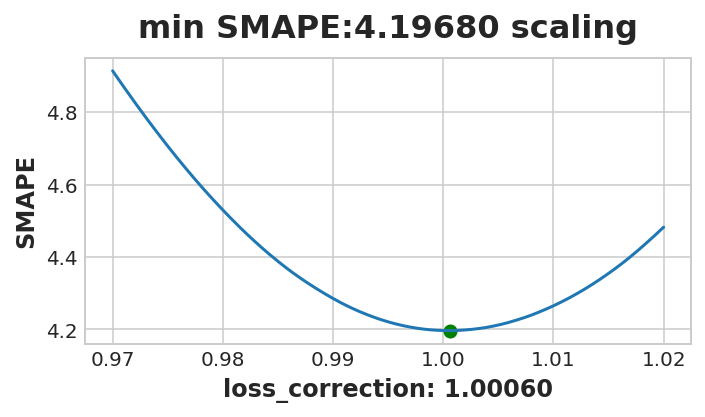

SMAPE (before correction: 4.19705)
Min SMAPE: 4.1968021678652265


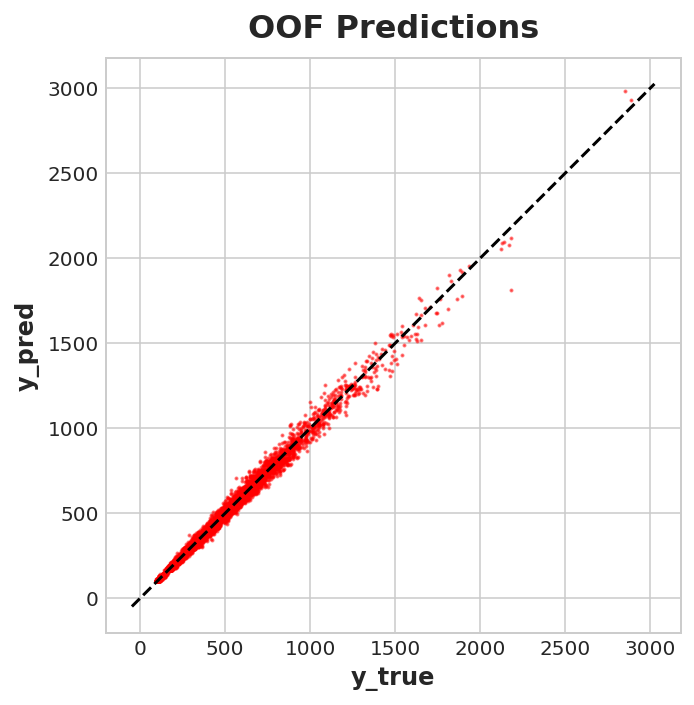

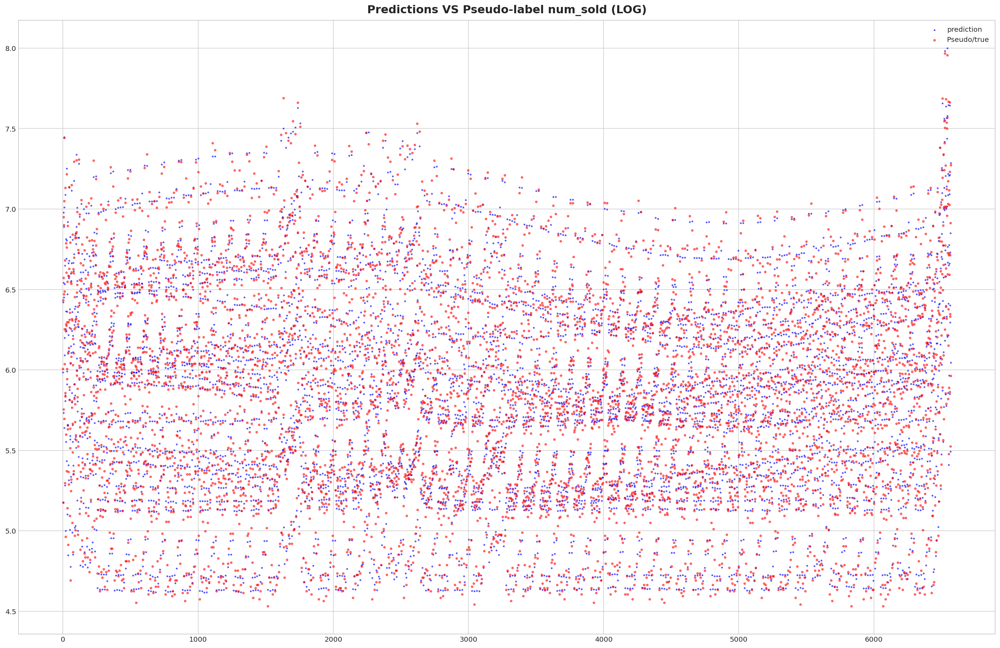

***********Test Data*****************
min SMAPE 0.65327
loss_correction: 0.99930


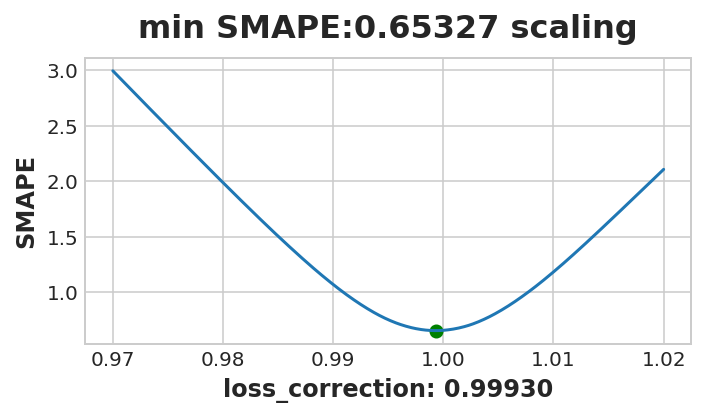

SMAPE (before correction: 0.65576)
Min SMAPE: 0.6532670625078569
CPU times: user 19.3 s, sys: 5.37 s, total: 24.6 s
Wall time: 19min 48s


In [51]:
%%time
LOSS_CORRECTION = 1
estimator_stack = []

param1 = {  'loss_function' : 'MultiRMSE',
            'eval_metric': 'MultiRMSE',
            'n_estimators': 1000,
            'od_type' : 'Iter',
            'od_wait' : 20,
            'random_state': RANDOM_STATE,
            'verbose': VERBOSE
         }
# Try different combinations of the algorithms above KNeighborsRegressor
models_1 = [Earth(verbose=VERBOSE), Ridge(), HuberRegressor(epsilon=1.20, max_iter=500)]
models_2 = [XGBRegressor(objective='reg:squarederror', tree_method='hist', eval_metric=smape_loss, n_estimators=1000),
            lgb.LGBMRegressor(objective='regression', n_estimators=1000, random_state=RANDOM_STATE),
            CatBoostRegressor(**param1),
           ]

for model_1 in models_1:
    for model_2 in models_2:
        model1_name = type(model_1).__name__
        model2_name = type(model_2).__name__
        hybrid_model = BoostedHybrid(
                model_1 = model_1,
                model_2 = model_2,
                scaler = preproc
                        )
        print(f'******************Stacking {model1_name:>15} with {model2_name:<18}*************************')
        estimator_stack.append((f'model_{model1_name}_{model2_name}', hybrid_model))
        

X2 = preproc.fit_transform(X2_train[features])
model = StackingRegressor(estimators=estimator_stack, final_estimator=RidgeCV(), n_jobs=-1, verbose=VERBOSE)
model, test_pred_list, LOSS_CORRECTION = model_fit_eval(model, X2, np.log1p(y_train), preproc.transform(X2_valid[features]), np.log1p(y_valid), preproc, LOSS_CORRECTION)

# Inference validation

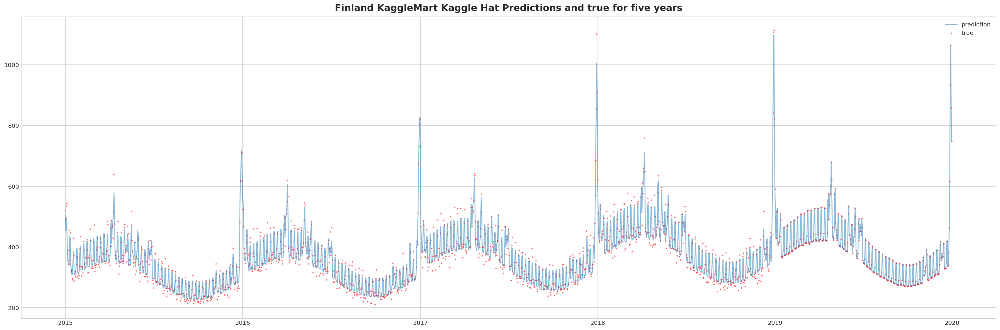

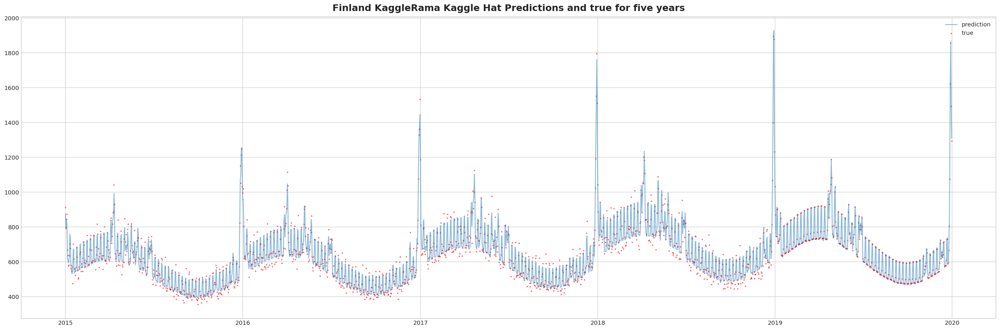

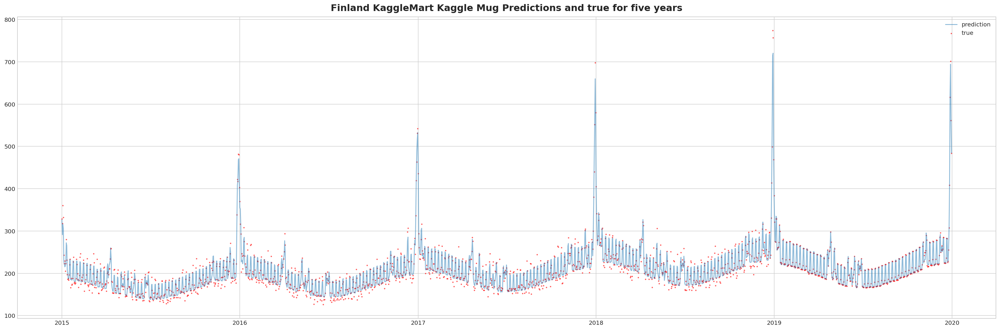

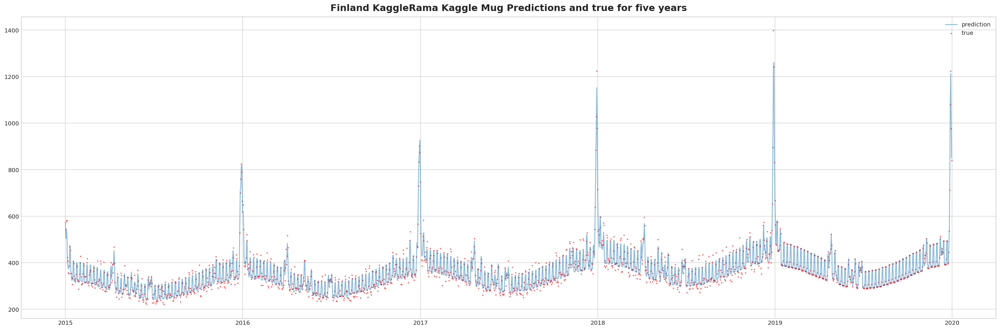

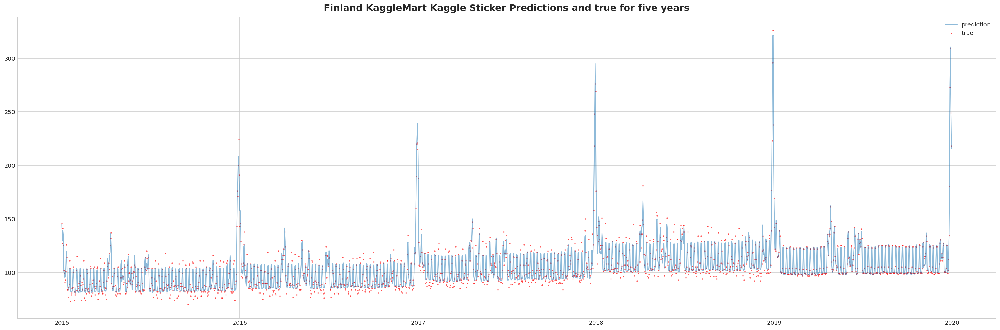

...

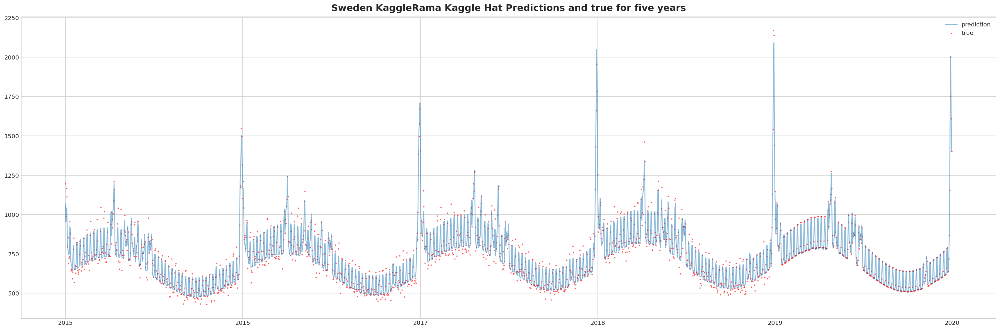

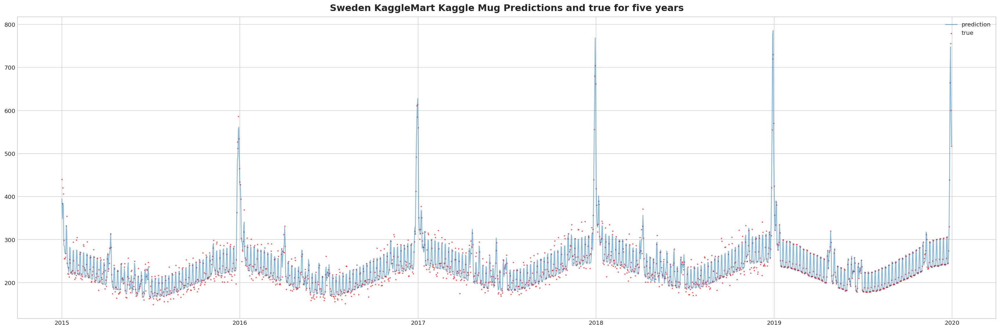

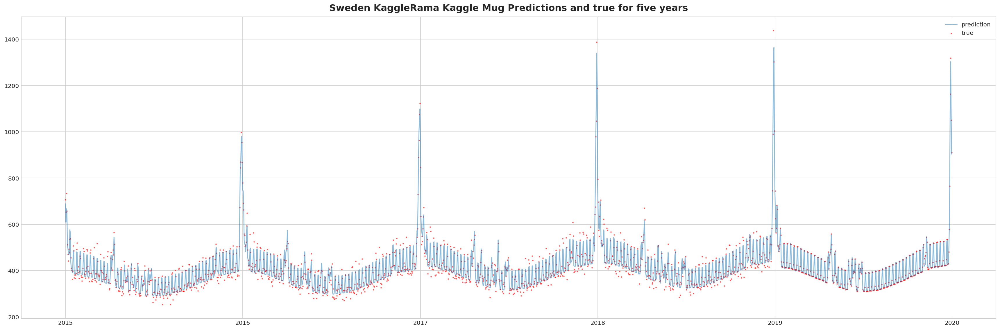

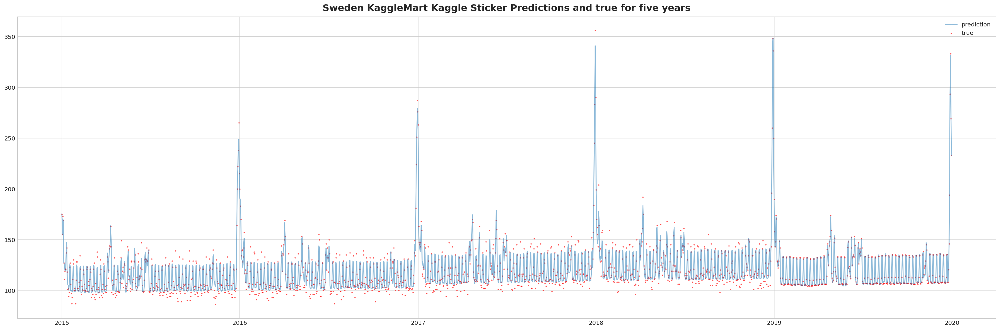

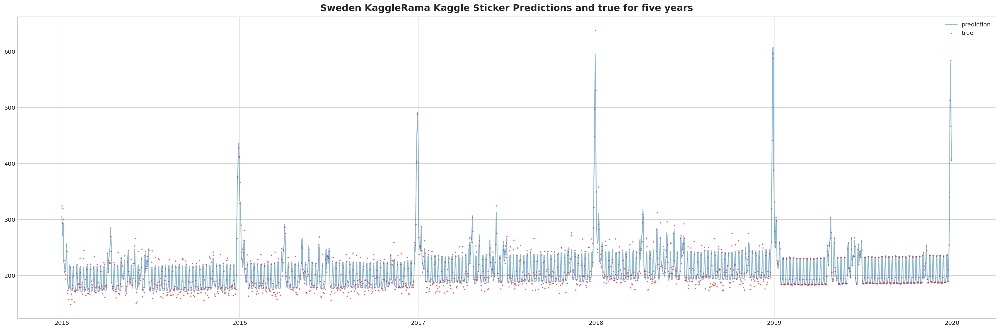

In [52]:
for country in np.unique(train_df['country']):
    for product in np.unique(train_df['product']):
        for store in np.unique(train_df['store']):
            y_fit = plot_five_years_combination(feature_engineer, country=country, product=product, store=store)

# Inference year 2019 test data

In [53]:
y_pred = sum(test_pred_list) / len(test_pred_list) #model.predict(X_test[features])

min SMAPE 0.65327
loss_correction: 0.99930


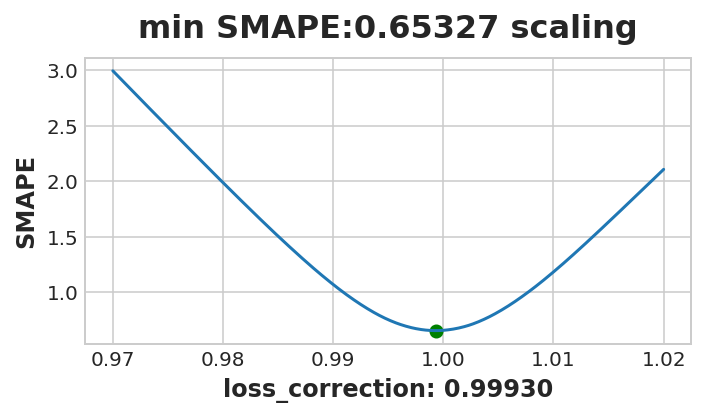

 SMAPE: 0.65576 (before correction: 0.65576)
0.6532670625078569
CPU times: user 438 ms, sys: 213 ms, total: 651 ms
Wall time: 298 ms


In [54]:
%%time
LOSS_CORRECTION = 1

###### Preprocess the validation data
y_va = df_pseudolabels[column_y].values.reshape(-1, 1)

# Inference for validation
y_va_pred = y_pred.copy().reshape(-1, 1) #model.predict(X_test[features])

# Evaluation: Execution time and SMAPE
smape_before_correction = np.mean(smape_loss(y_va, y_va_pred))
smape = np.mean(smape_loss(y_va, y_va_pred))
LOSS_CORRECTION = find_min_SMAPE(y_va, y_va_pred)
y_va_pred *= LOSS_CORRECTION

print(f" SMAPE: {smape:.5f} (before correction: {smape_before_correction:.5f})")
print(np.mean(smape_loss(y_va, y_va_pred)))

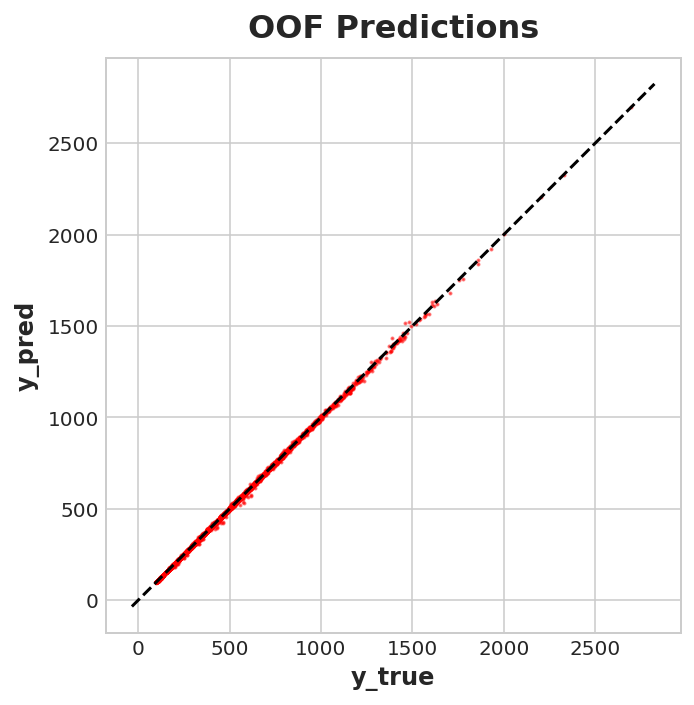

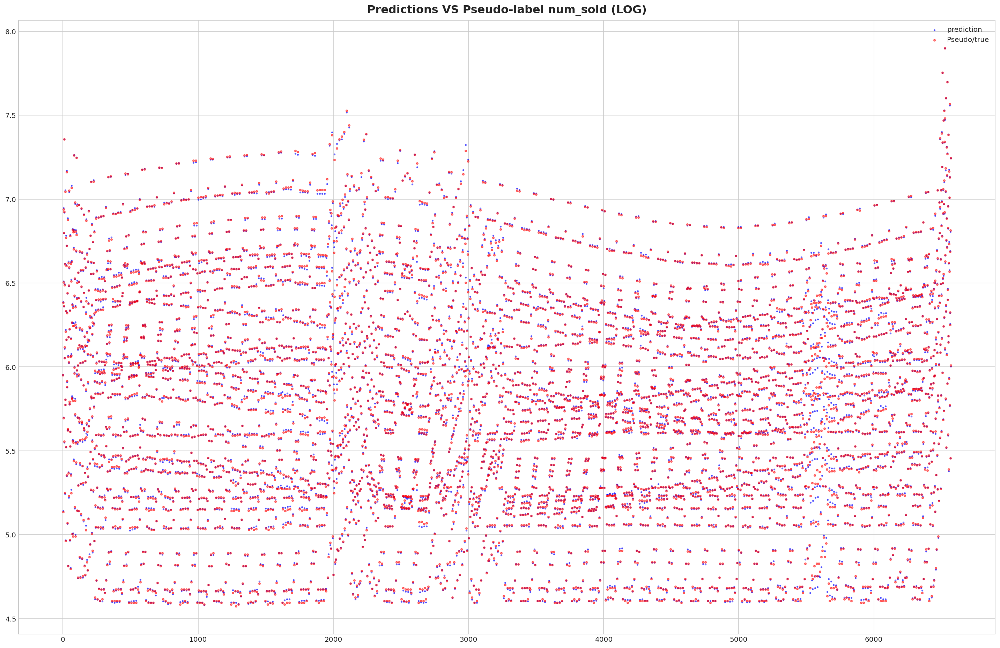

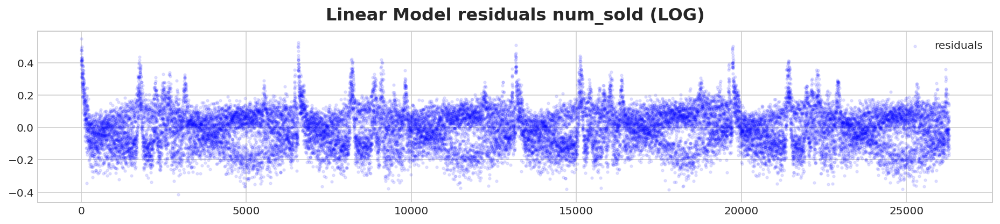

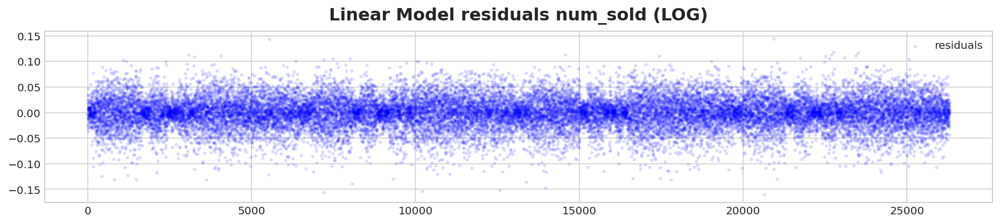

In [55]:
plot_oof(y_va, y_va_pred)
plot_true_vs_prediction(y_va, y_va_pred)
plot_residuals(model.estimators_[0].y_resid)
plot_residuals(model.estimators_[0].y_resid2)
# plot_residuals(model.y_resid3)

In [56]:
families = kaggle_sales.loc[:, column_y].columns[0:]

In [57]:
# k_sales = kaggle_sales.copy()

In [58]:
# k_sales[column_y].unstack().unstack().unstack().unstack().unstack()['2019']

In [59]:
# len(y_pred)

In [60]:
# kaggle_sales.loc[:, column_y].loc(axis=1)[families]
# axs = kaggle_sales.loc[:, column_y].plot(
#     subplots=True, sharex=True, figsize=(30, 80), **plot_params, alpha=0.5,
# )
# _ = y_fit.plot(subplots=True, sharex=True, color='C0', ax=axs)
# _ = y_pred.plot(subplots=True, sharex=True, color='C3', ax=axs)
# for ax, family in zip(axs, families):
#     ax.legend(['true','train','forecast'])
#     ax.set_ylabel(family)

# Submission
Once you're satisfied with everything, it's time to create your final predictions! This cell will:

- use the best trained model to make predictions from the test set
- save the predictions to a CSV file


In [61]:
from math import ceil, floor, sqrt
# from https://www.kaggle.com/fergusfindley/ensembling-and-rounding-techniques-comparison
def geometric_round(arr):
    result_array = arr
    result_array = np.where(result_array < np.sqrt(np.floor(arr)*np.ceil(arr)), np.floor(arr), result_array)
    result_array = np.where(result_array >= np.sqrt(np.floor(arr)*np.ceil(arr)), np.ceil(arr), result_array)

    return result_array

In [62]:
sub = pd.read_csv('../input/tabular-playground-series-jan-2022/sample_submission.csv')

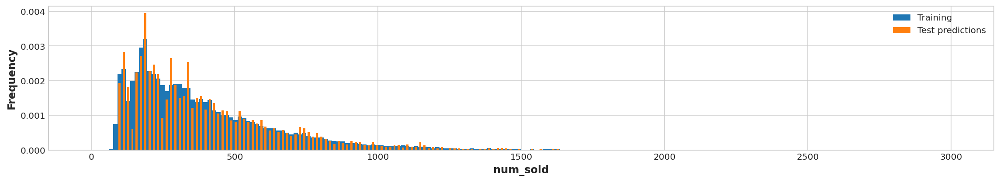

In [63]:

# Inference for test
test_prediction_list = []
test_prediction_list.append(y_pred) # * LOSS_CORRECTION)
if BLEND:
    df_pseudolabels1 = pd.read_csv(PSEUDO_DIR2, index_col=ID)
    test_prediction_list.append(df_pseudolabels[column_y].values) #blender 1
#     test_prediction_list.append(df_pseudolabels1[column_y].values) #blender 2
test_prediction_list = np.median(test_prediction_list, axis=0) # median is better https://www.kaggle.com/saraswatitiwari/tabular-playground-series-22

if len(test_prediction_list) > 0:
    # Create the submission file
    submission = pd.DataFrame(data=np.zeros((sub.shape[0],2)),index = sub.index.tolist(),columns=[ID,column_y])
    submission[ID] = sub[ID]
    submission[column_y] = test_prediction_list
    submission[column_y] = geometric_round(submission[column_y]).astype(int) #https://www.kaggle.com/c/tabular-playground-series-jan-2022/discussion/299162
    submission.to_csv('submission.csv', index=False)

    # Plot the distribution of the test predictions
    plt.figure(figsize=(16,3))
    plt.hist(train_df[column_y], bins=np.linspace(0, 3000, 201),
             density=True, label='Training')
    plt.hist(submission[column_y], bins=np.linspace(0, 3000, 201),
             density=True, rwidth=0.5, label='Test predictions')
    plt.xlabel(column_y)
    plt.ylabel('Frequency')
    plt.legend()
    plt.show()

In [64]:
display(submission.head(30))
display(submission.tail(30))

,row_id,num_sold
0,26298,384
1,26299,593
2,26300,170
3,26301,669
4,26302,1035
5,26303,297
6,26304,578
7,26305,896
8,26306,257
9,26307,1014


,row_id,num_sold
6540,32838,823
6541,32839,1263
6542,32840,365
6543,32841,1439
6544,32842,2207
6545,32843,641
6546,32844,602
6547,32845,921
6548,32846,268
6549,32847,1051


To submit these predictions to the competition, follow these steps:

1. Begin by clicking on the blue **Save Version** button in the top right corner of the window.  This will generate a pop-up window.
2. Ensure that the **Save and Run All** option is selected, and then click on the blue **Save** button.
3. This generates a window in the bottom left corner of the notebook.  After it has finished running, click on the number to the right of the **Save Version** button.  This pulls up a list of versions on the right of the screen.  Click on the ellipsis **(...)** to the right of the most recent version, and select **Open in Viewer**.  This brings you into view mode of the same page. You will need to scroll down to get back to these instructions.
4. Click on the **Output** tab on the right of the screen.  Then, click on the file you would like to submit, and click on the blue **Submit** button to submit your results to the leaderboard.

You have now successfully submitted to the competition!

# Next Steps #

If you want to keep working to improve your performance, select the blue **Edit** button in the top right of the screen. Then you can change your code and repeat the process. There's a lot of room to improve, and you will climb up the leaderboard as you work.

Be sure to check out [other users' notebooks](https://www.kaggle.com/c/tabular-playground-series-jan-2022/code) in this competition. You'll find lots of great ideas for new features and as well as other ways to discover more things about the dataset or make better predictions. There's also the [discussion forum](https://www.kaggle.com/c/tabular-playground-series-jan-2022/discussion), where you can share ideas with other Kagglers.

Have fun Kaggling!

In [65]:
# from statsmodels.tsa.api import acf, graphics, pacf
# from statsmodels.tsa.ar_model import AutoReg, ar_select_order

In [66]:
# train_data[column_y]

In [67]:
# y.index

In [68]:
# mod = AutoReg(y, 3, old_names=False)
# res = mod.fit()
# print(res.summary())

In [69]:
# res = mod.fit(cov_type="HC0")
# print(res.summary())

In [70]:
# fig = res.predict(start=26298, end=(26298+365*18))

In [71]:
# plt.figure(figsize=(30, 12))
# plt.scatter(np.arange(len(fig)), fig, label='prediction', alpha=0.5, color='blue', s=5)
# plt.scatter(np.arange(len(df_pseudolabels)), df_pseudolabels.num_sold, label='true', alpha=0.5, color='red', s=5)
# plt.legend()
# plt.title('Predictions and pseudo num_sold for 2019 (LOG)')
# plt.show()

In [72]:
# fig[:40]

In [73]:
# fig = plt.figure(figsize=(16, 9))
# fig = res.plot_diagnostics(fig=fig, lags=30)